importing Jupyter notebook from truncated_epath_trees.ipynb


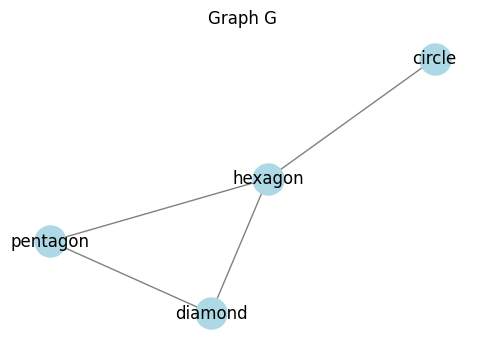

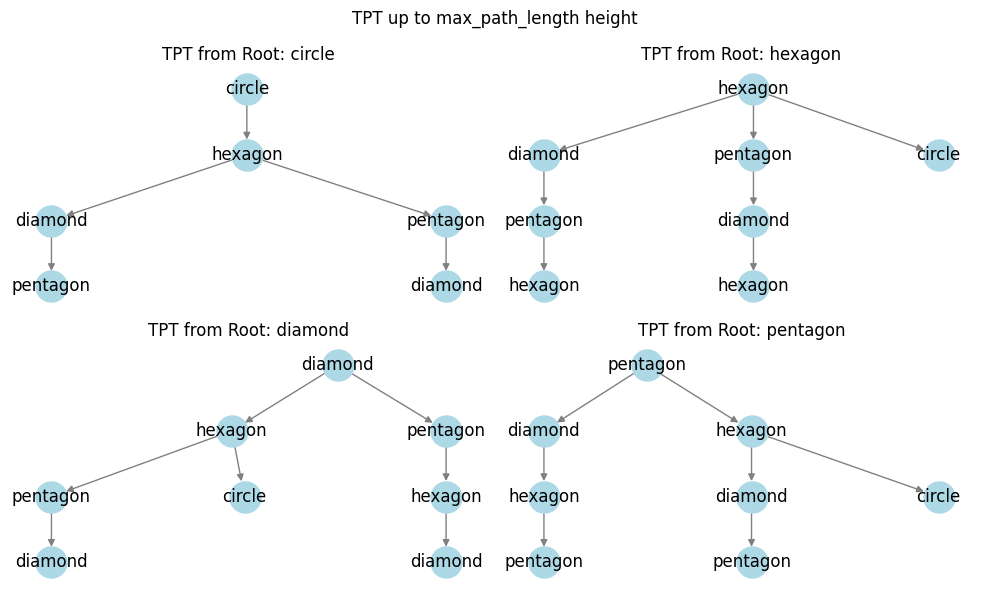

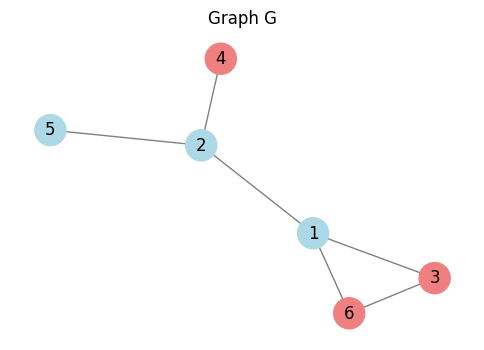

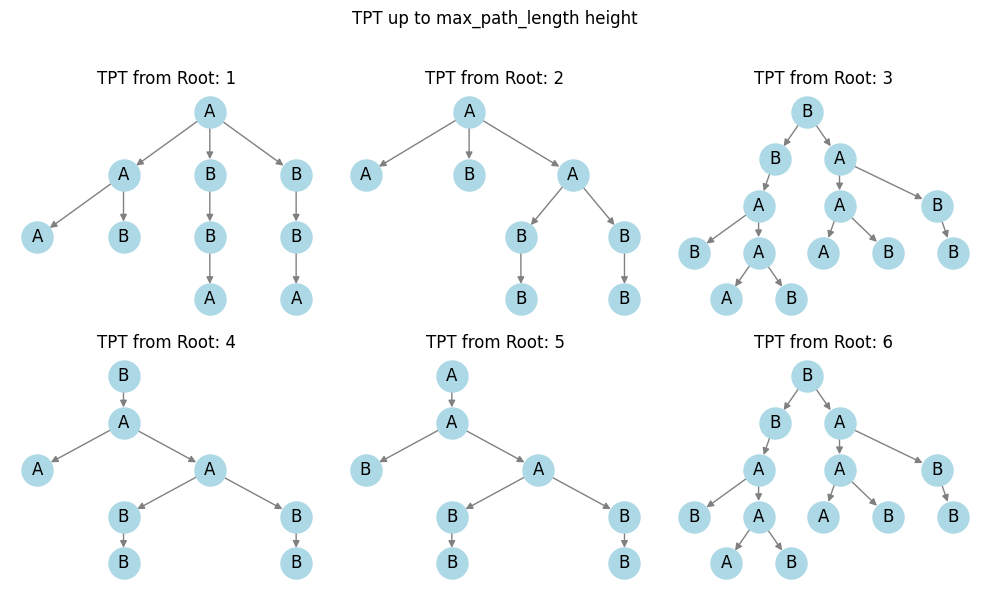

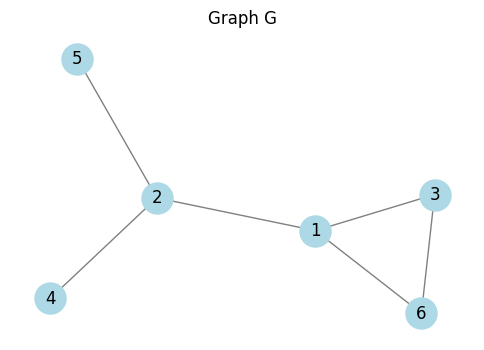

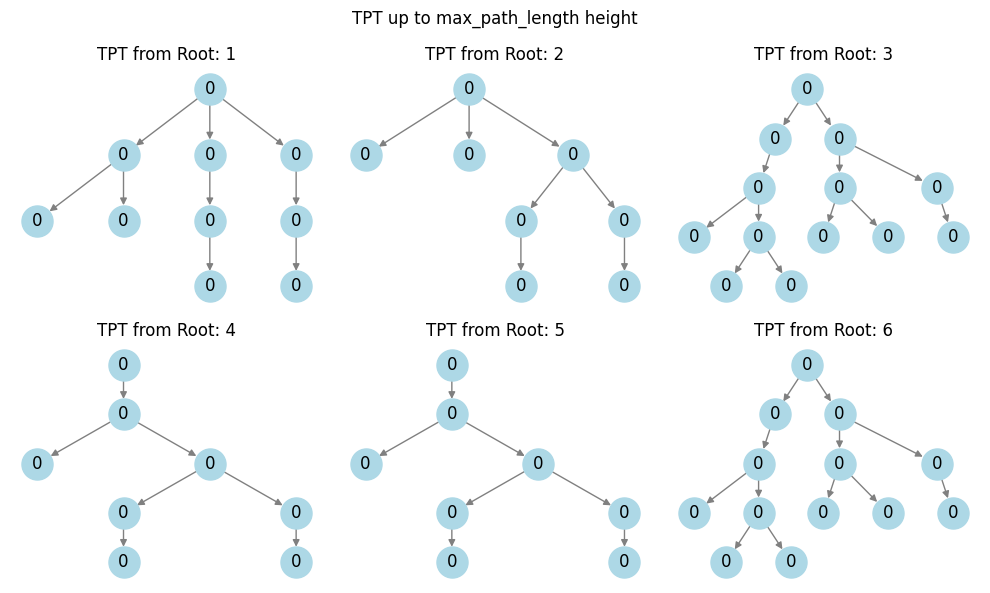

importing Jupyter notebook from k_redundant_trees.ipynb


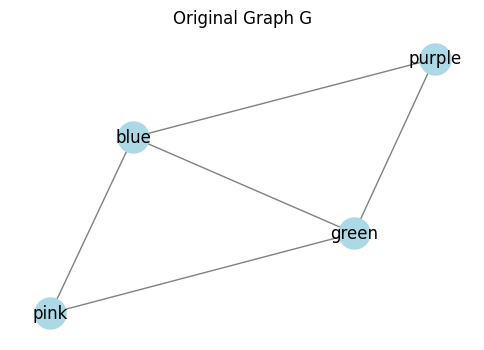

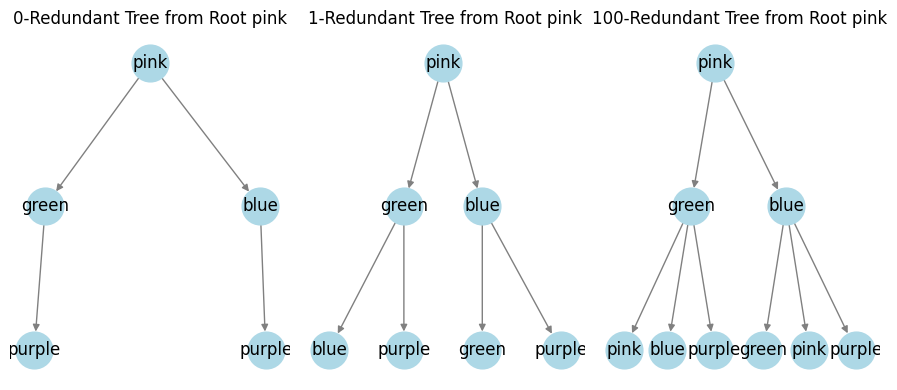

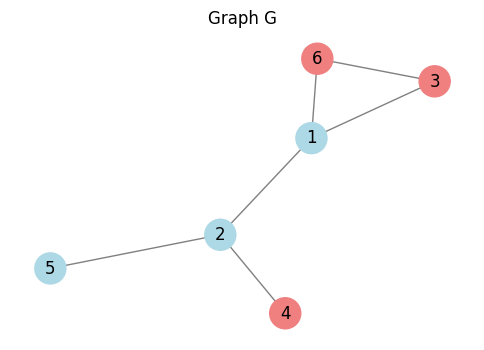

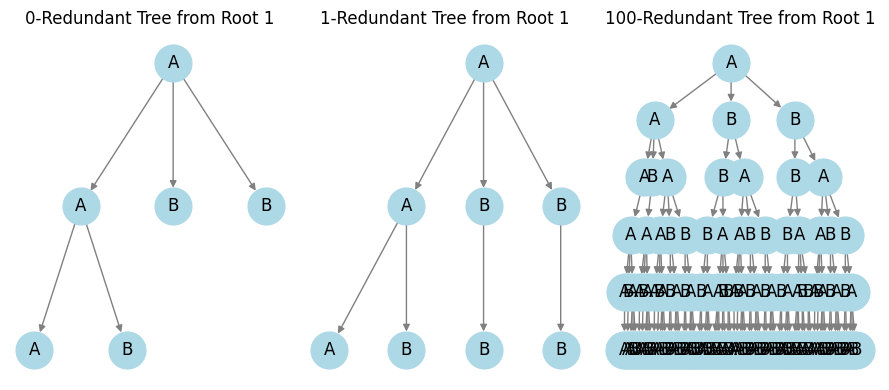

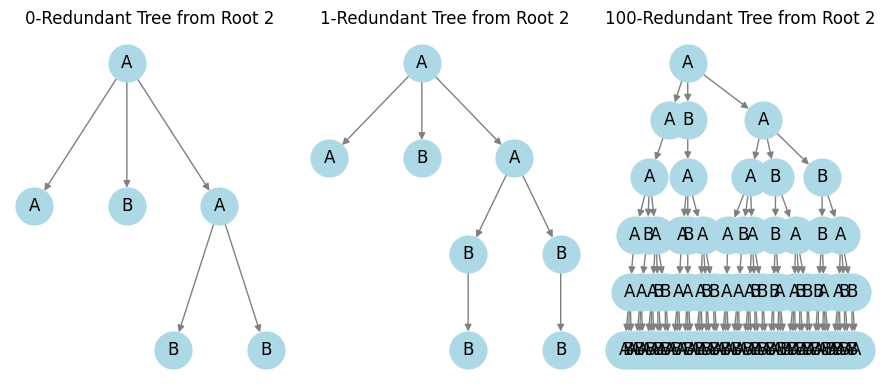

...

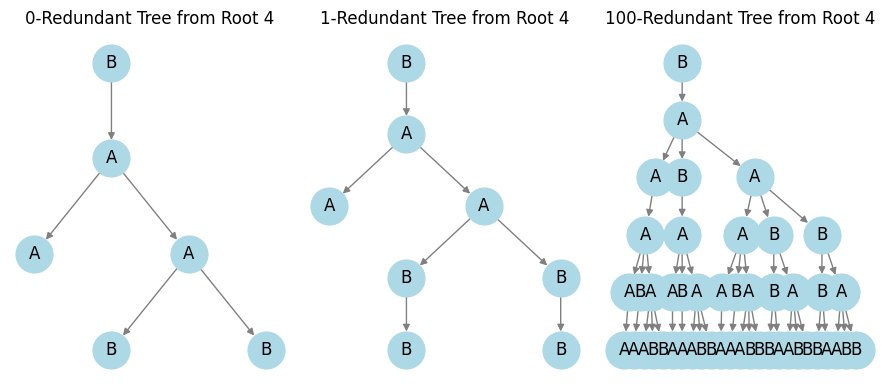

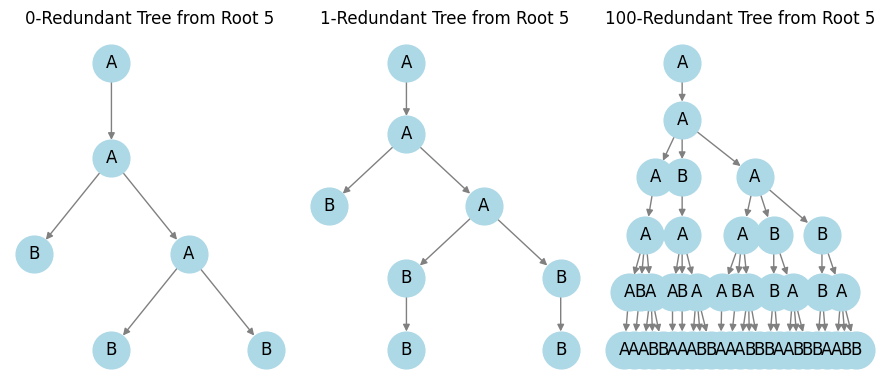

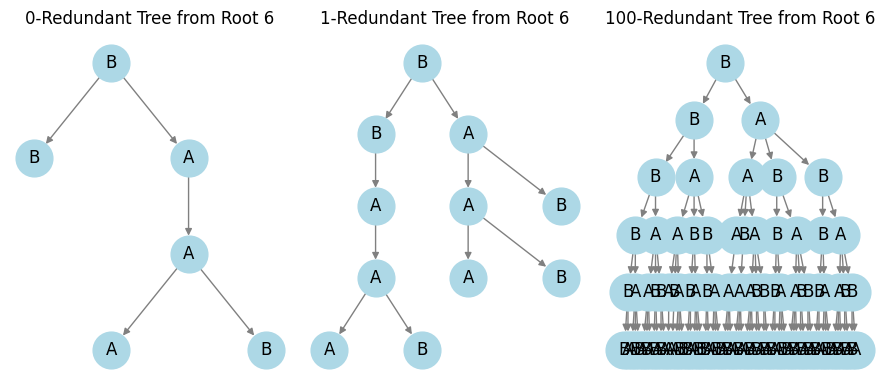

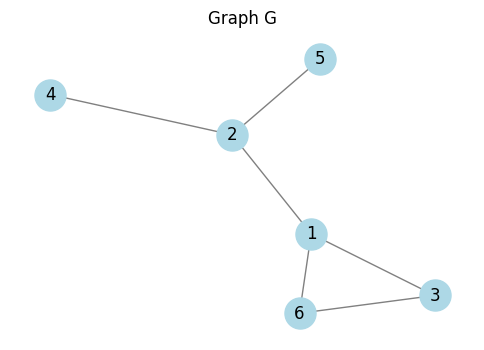

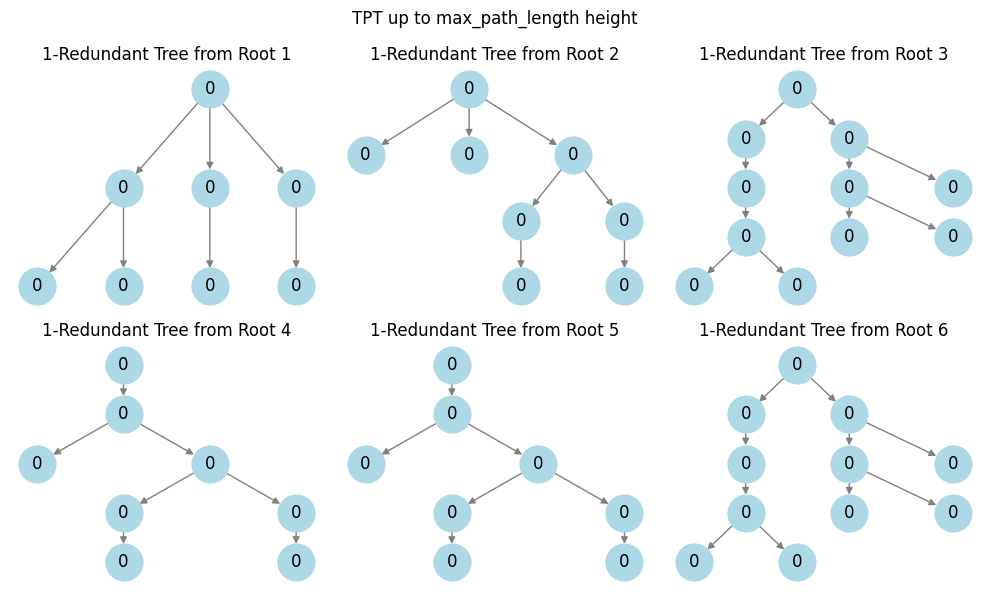

importing Jupyter notebook from tree_isomorphism.ipynb


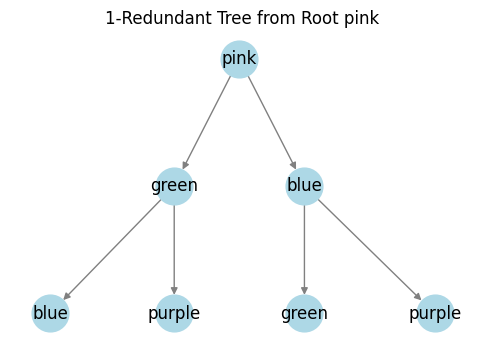

2


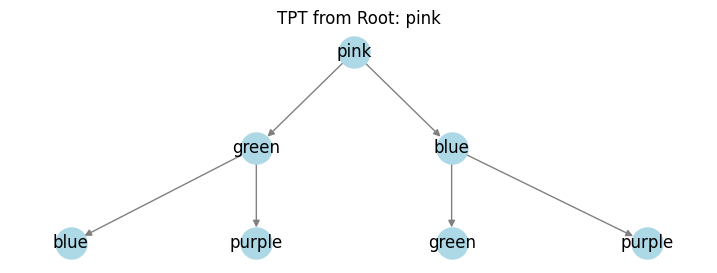

pinkbluegreen$purple$$greenblue$purple$$
pinkbluegreen$purple$$greenblue$purple$$
True


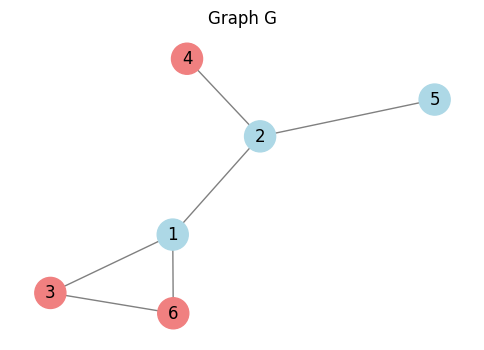

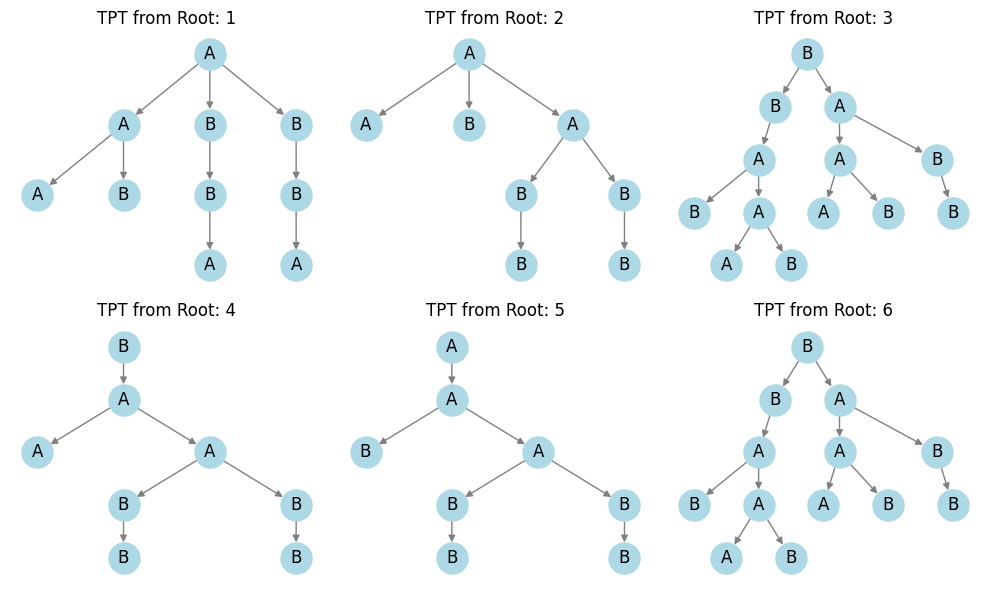

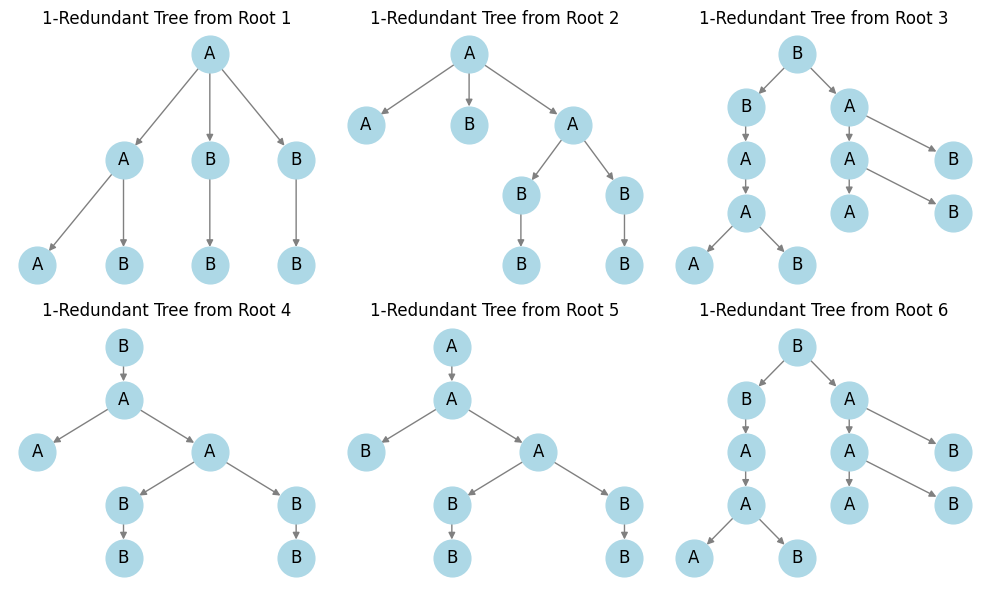

['AAA$B$$BBA$$$BBA$$$', 'AA$ABB$$BB$$$B$', 'BAAA$B$$BB$$$BAAA$B$$B$$$', 'BAA$ABB$$BB$$$$', 'AAABB$$BB$$$B$$', 'BAAA$B$$BB$$$BAAA$B$$B$$$']
['AAA$B$$BB$$BB$$', 'AA$ABB$$BB$$$B$', 'BAAA$B$$B$$BAAA$B$$$$', 'BAA$ABB$$BB$$$$', 'AAABB$$BB$$$B$$', 'BAAA$B$$B$$BAAA$B$$$$']


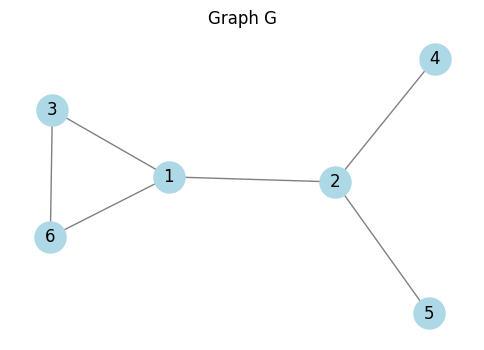

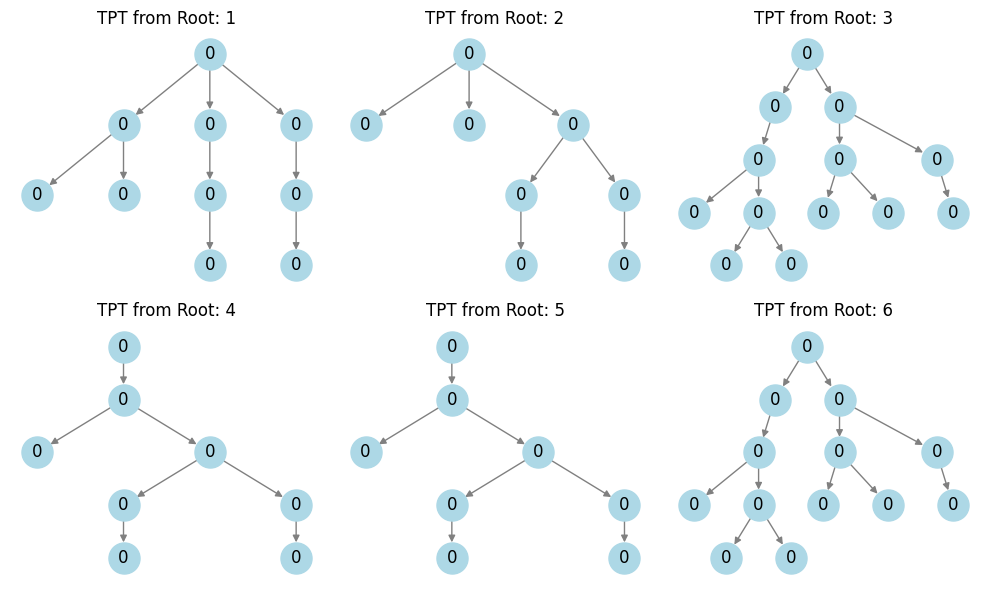

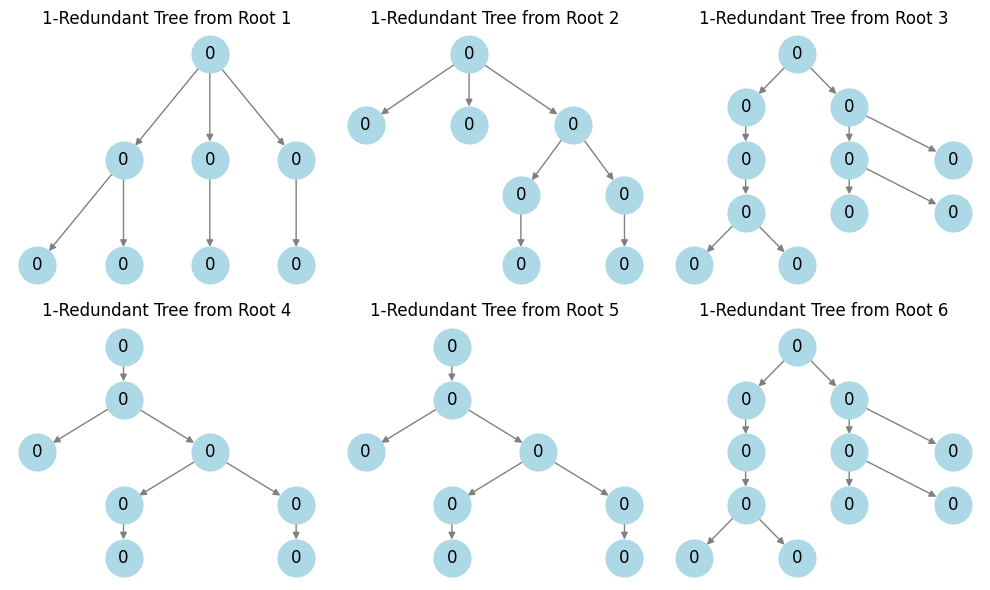

['000$0$$000$$$000$$$', '00$0$000$$00$$$', '0000$$00$0$$$000$00$0$$$$', '000$000$$00$$$$', '000$000$$00$$$$', '0000$$00$0$$$000$00$0$$$$']
['000$$00$$00$0$$', '00$0$000$$00$$$', '000$00$0$$$0000$0$$$$', '000$000$$00$$$$', '000$000$$00$$$$', '000$00$0$$$0000$0$$$$']


In [1]:
import import_ipynb
import truncated_epath_trees as tpt
import k_redundant_trees as knt
import tree_isomorphism as ti
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
def read_g6_file(file_path):
    with open(file_path, 'r') as file:
        g6_string = file.read().strip()
    return nx.from_graph6_bytes(g6_string.encode())

def nx_to_adj_list(nx_graph):
    adj_list = {}
    for node in nx_graph.nodes:
        adj_list[str(node)] = [str(neighbor) for neighbor in nx_graph.neighbors(node)]
    return adj_list

file_path = 'strongly_regular_graphs/sr25832.g6'
nx_graph = read_g6_file(file_path)
adjacency_list = nx_to_adj_list(nx_graph)

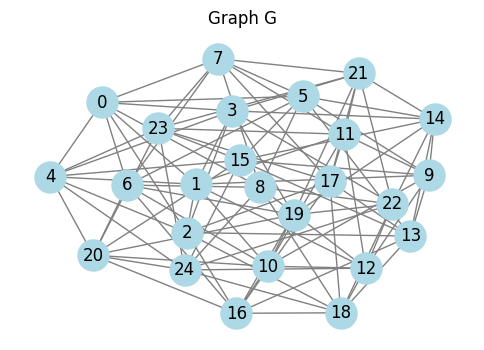

knts:  ['0000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$', '0000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0$0$$00$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$00$0$0$0$0$0$$$000$0$0$0$$00$0$0

In [3]:
def debug_canonize_tree(tree):
    # Print tree details before canonization
    print("Tree before canonization:")
    tree.print_tree()
    canonized_tree = ti.canonize_tree(tree)
    
    if isinstance(canonized_tree, str):
        # If the canonized tree is a string, just print it
        print("Tree after canonization (as string):")
        print(canonized_tree)
    else:
        # Print tree details after canonization if it's a tree object
        print("Tree after canonization:")
        canonized_tree.print_tree()
        
    return canonized_tree

# Create an instance of Graph class
G = tpt.Graph(adjacency_list)

# Plotting the graph G
fig, ax = plt.subplots(figsize=(6, 4))
G_nx = nx.Graph(G.adjacency_list)
nx.draw(G_nx, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500, ax=ax)
ax.set_title("Graph G")
plt.show()

all_nodes = list(G.adjacency_list.keys())
max_height = len(all_nodes) + 2

kNTs = []
TPTs = []
for root in all_nodes:
    kNT = knt.kNT(G=G, root=root, k=1, h=max_height)
    for knt_node in kNT.unfolding_tree.nodes():
        # Treat all nodes as having the same label '0'
        kNT.node_labels[knt_node] = {'name': '0'}
    canonized_knt = ti.canonize_tree(kNT)
    kNTs.append(canonized_knt)

    TPT = tpt.TPT(G, root, max_depth=max_height)
    for node in TPT.tpt_tree.nodes():
        TPT.node_labels[node] = {'name': '0'}
    canonized_tpt = ti.canonize_tree(TPT)
    TPTs.append(canonized_tpt)


print('knts: ',kNTs)
print('tpts: ',TPTs)

In [4]:
import networkx as nx

def read_graph_from_file(filename):
    adjacency_list = {}
    with open(filename, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts[0] == 'e':
                node1 = str(parts[1])
                node2 = str(parts[2])
                if node1 not in adjacency_list:
                    adjacency_list[node1] = []
                if node2 not in adjacency_list:
                    adjacency_list[node2] = []
                adjacency_list[node1].append(node2)
                adjacency_list[node2].append(node1)
    return tpt.Graph(adjacency_list)

filename = 'usr/usr(1)_29-1'
G = read_graph_from_file(filename)
G.adjacency_list = G.two_direction_adj_list()

all_nodes = list(G.adjacency_list.keys())
max_height = len(all_nodes) + 2

kNTs = []
TPTs = []
for root in all_nodes:
    kNT = knt.kNT(G=G, root=root, k=1, h=max_height)
    for knt_node in kNT.unfolding_tree.nodes():
        # Treat all nodes as having the same label '0'
        kNT.node_labels[knt_node] = {'name': '0'}
    canonized_knt = ti.canonize_tree(kNT)
    kNTs.append(canonized_knt)

    TPT = tpt.TPT(G, root, max_depth=max_height)
    for node in TPT.tpt_tree.nodes():
        TPT.node_labels[node] = {'name': '0'}
    canonized_tpt = ti.canonize_tree(TPT)
    TPTs.append(canonized_tpt)

print('knts: ',kNTs)
print('tpts: ',TPTs)

knts:  ['0000$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$$000$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$$000$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$$000$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$$000$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$0$0$0$0$0$$00$0$